### 1. 此处文件用来对数据进行一些简单的分析

首先对预处理后的数据进行相关性的分析，看看有没有明显的相关性

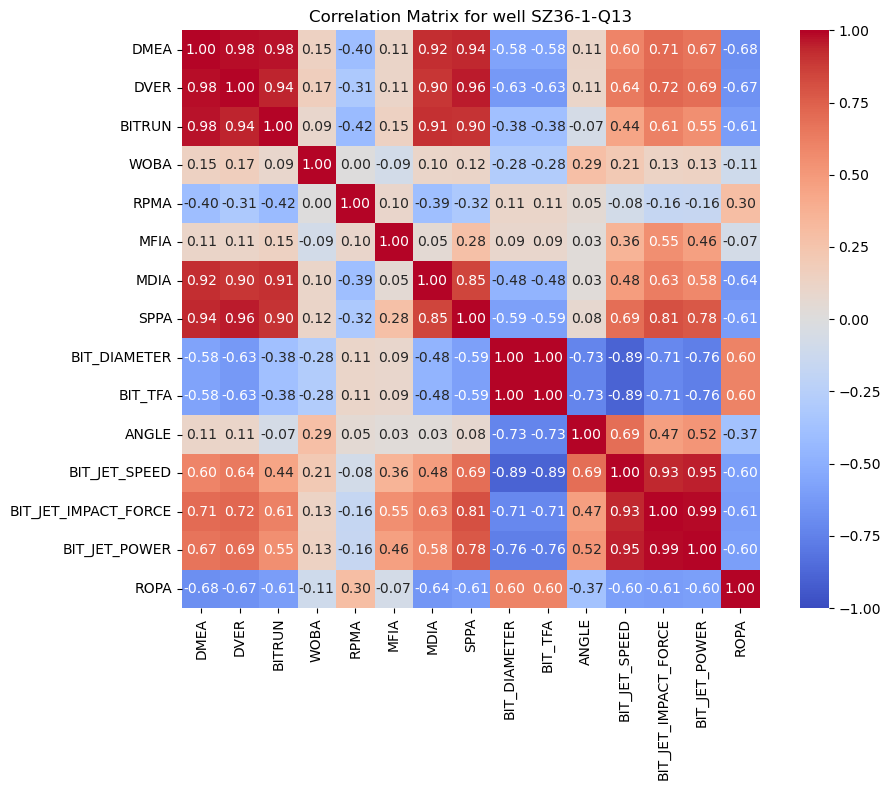

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14']
well_name = well_ids[9]
df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)

# put ROPA to the last column
df = df[[c for c in df.columns if c != 'ROPA'] + ['ROPA']]
# 计算相关性矩阵
corr_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, 
            annot=True,  # 显示相关系数
            cmap='coolwarm',  # 使用红蓝色配色
            vmin=-1, vmax=1,  # 设置色彩范围
            center=0,  # 设置中心点
            fmt='.2f',  # 显示两位小数
            square=True)  # 使用正方形格子
plt.title(f'Correlation Matrix for well {well_name}')
plt.tight_layout()
plt.show()

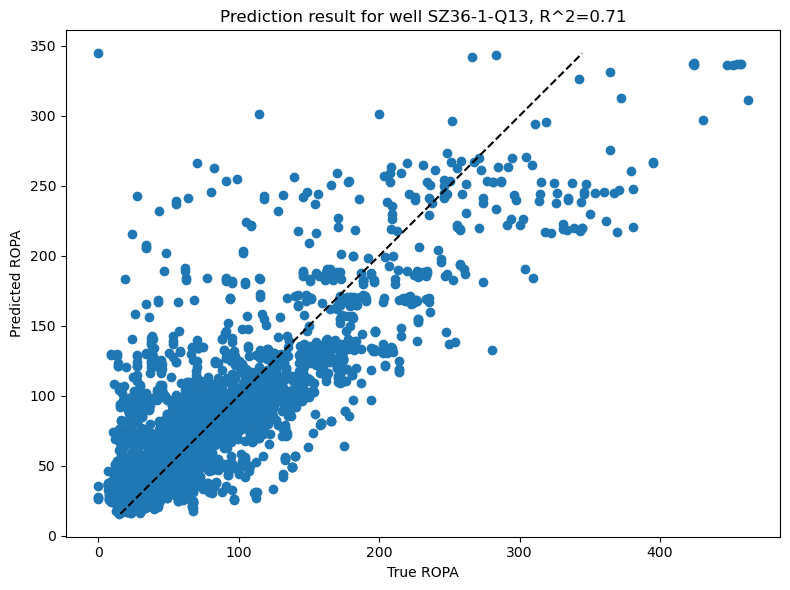

In [4]:
# 尝试一下在 某口井上面，'SZ36-1-Q13' 井上训练一个线性回归模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14']
well_name = well_ids[9]

df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPA'])
y_train = train_df['ROPA']

X_test = test_df.drop(columns=['ROPA'])
y_test = test_df['ROPA']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPA')
plt.ylabel('Predicted ROPA')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()


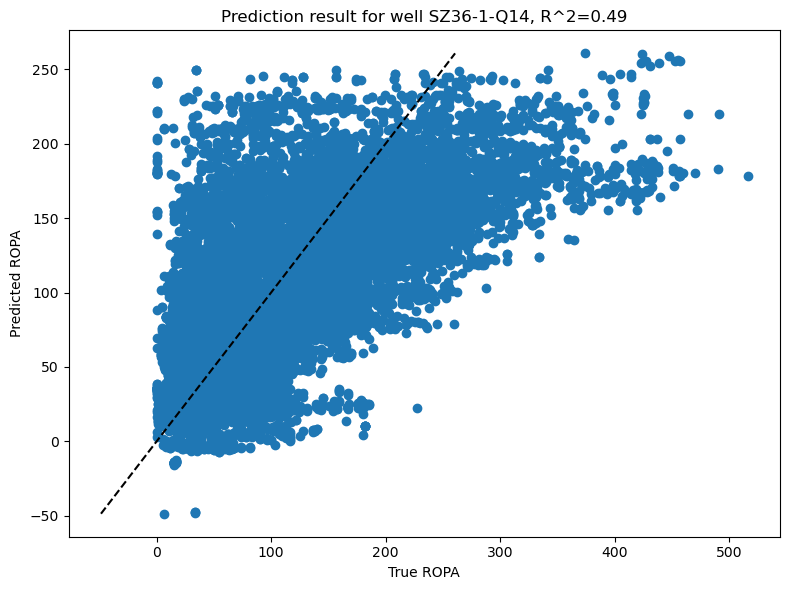

In [31]:
# 尝试一下在 所有井上面训练一个线性回归模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14']

dfs = []
for well_name in well_ids:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    dfs.append(df)
df = pd.concat(dfs)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPA'])
y_train = train_df['ROPA']

X_test = test_df.drop(columns=['ROPA'])
y_test = test_df['ROPA']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPA')
plt.ylabel('Predicted ROPA')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()


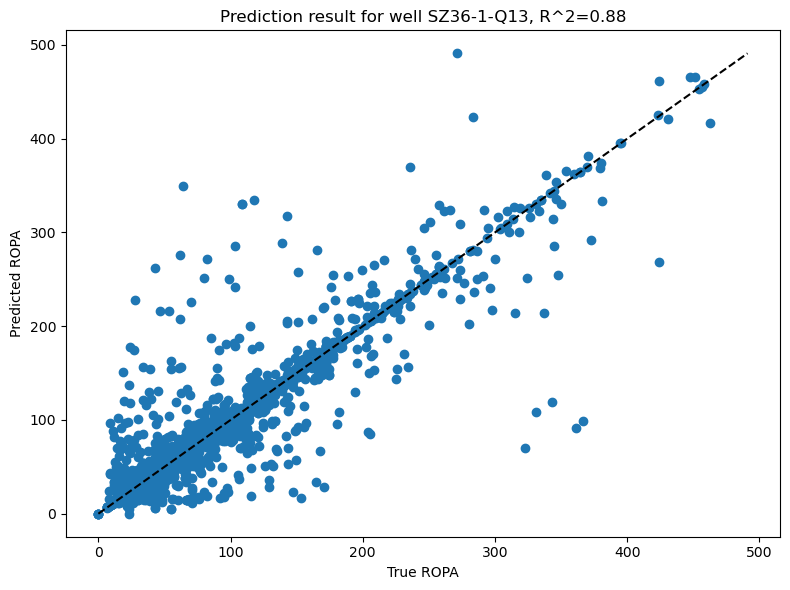

In [50]:
# 尝试一下在 某口井上面，'SZ36-1-Q13' 井上训练一个决策树模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor

from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14']
well_name = well_ids[9]

df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPA'])
y_train = train_df['ROPA']

X_test = test_df.drop(columns=['ROPA'])
y_test = test_df['ROPA']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = DecisionTreeRegressor()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPA')
plt.ylabel('Predicted ROPA')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()


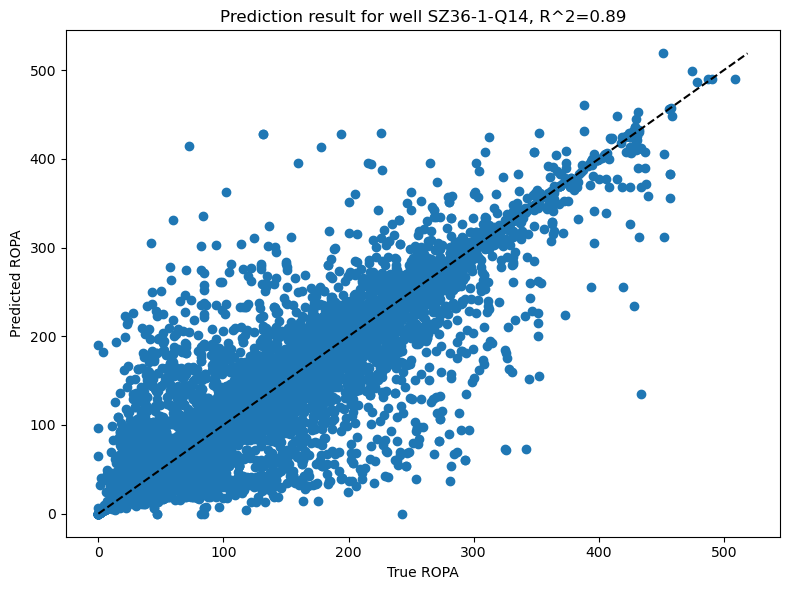

In [51]:
# 尝试一下在 所有井上面训练一个决策树回归模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q14']

dfs = []
for well_name in well_ids:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    dfs.append(df)
df = pd.concat(dfs)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPA'])
y_train = train_df['ROPA']

X_test = test_df.drop(columns=['ROPA'])
y_test = test_df['ROPA']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = DecisionTreeRegressor()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPA')
plt.ylabel('Predicted ROPA')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()


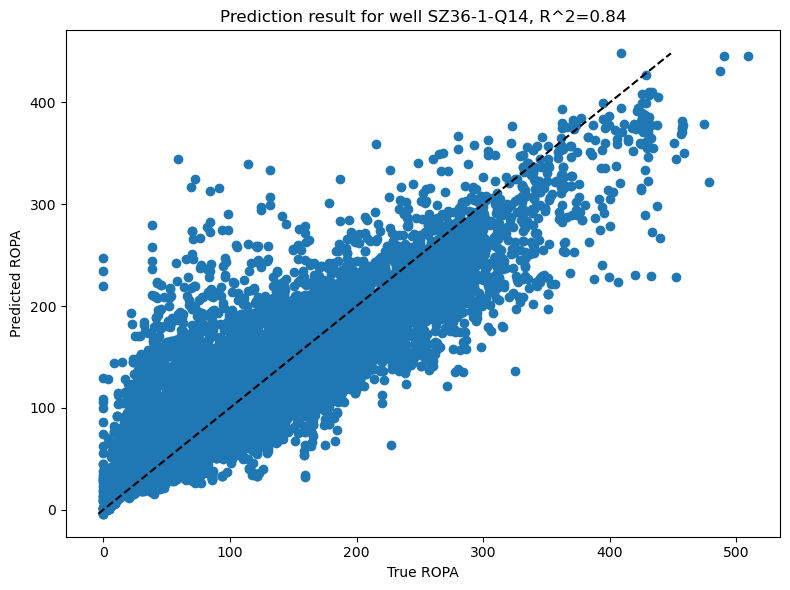

In [52]:
# 尝试一下在 所有井上面训练一个XGboost回归模型来测试效果
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q14']

dfs = []
for well_name in well_ids:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    dfs.append(df)
df = pd.concat(dfs)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPA'])
y_train = train_df['ROPA']

X_test = test_df.drop(columns=['ROPA'])
y_test = test_df['ROPA']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = xgb.XGBRegressor()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPA')
plt.ylabel('Predicted ROPA')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()


In [53]:
# 可视化特定一口井的ROPA 和 预测的ROPAs

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

well_name = 'SZ36-1-Q14'
df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)

# put ROPA to the last column
df = df[[c for c in df.columns if c != 'ROPA'] + ['ROPA']]

# plot ROPA
test_x = df.drop(columns=['ROPA'])

test_x = scaler.transform(test_x)
df['Predicted_ROPA'] = model.predict(test_x)

R2 = model.score(test_x, df['ROPA'])

fig = make_subplots(rows=1, cols=1, shared_xaxes=True, vertical_spacing=0.02)

fig.add_trace(go.Scatter(x=df.index, y=df['ROPA'], mode='lines', name='ROPA'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['Predicted_ROPA'], mode='lines', name='Predicted_ROPA'), row=1, col=1)

fig.update_layout(title=f'ROPA for well {well_name}, R^2={R2:.2f}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800)
fig.show()

In [54]:
# 分析一下时间输入数据的时间间隔，然后考虑将连续一段时间内的ROPA当作预测的目标

well_name = 'SZ36-1-Q13'
df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['ROPA'], mode='lines', name='ROPA'))
fig.update_layout(title=f'ROPA for well {well_name}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800
                    )


In [81]:
import numpy as np
from preprocess import smooth_the_ROPA

well_name = 'SZ36-1-Q14'
df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
df = smooth_the_ROPA(df, allowed_time_gap=180)

fig = go.Figure()

# fig.add_trace(go.Scatter(x=df.index, y=df['ROPA'], mode='lines', name='ROPA'))
fig.add_trace(go.Scatter(x=df.index, y=df['ROPASMOOTH'], mode='lines', name='ROPASMOOTH'))
fig.update_layout(title=f'ROPA for well {well_name}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800
                    )
fig.show()

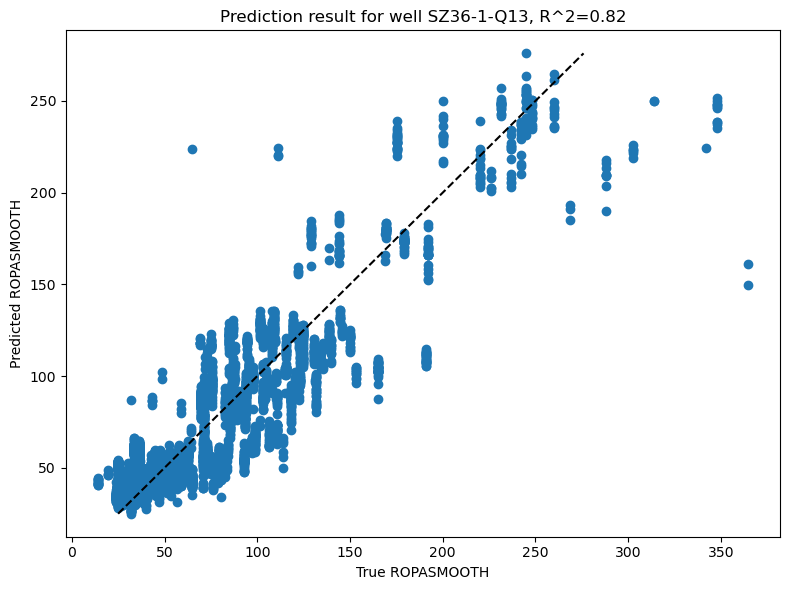

In [82]:
# 尝试一下在 某口井上面，'SZ36-1-Q13' 井上训练一个线性回归模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14']
well_name = well_ids[9]

df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
# df.drop(columns=['ROPA'], inplace=True)
df = smooth_the_ROPA(df, allowed_time_gap=200)
df.drop(columns=['ROPA'], inplace=True)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPASMOOTH'])
y_train = train_df['ROPASMOOTH']

X_test = test_df.drop(columns=['ROPASMOOTH'])
y_test = test_df['ROPASMOOTH']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPASMOOTH')
plt.ylabel('Predicted ROPASMOOTH')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()

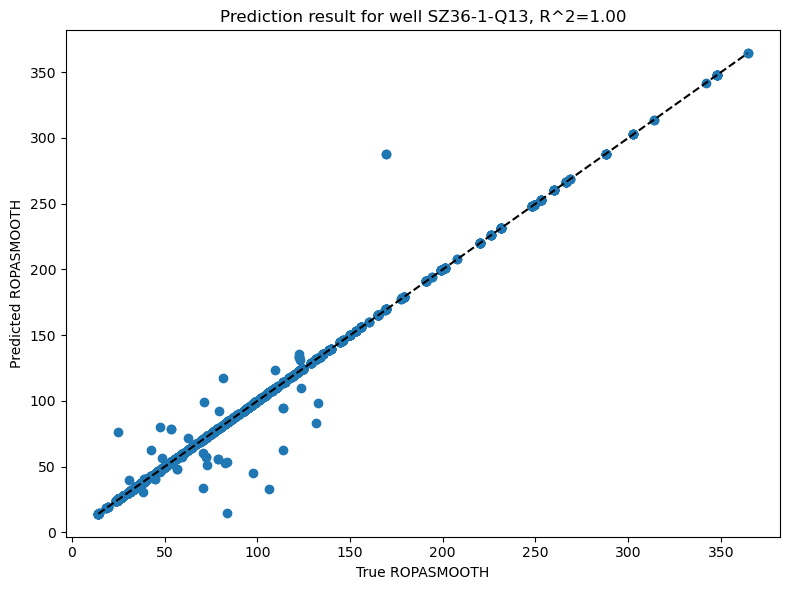

In [108]:
# 尝试一下在 某口井上面，'SZ36-1-Q13' 井上用平滑后的ROPA，然后训练一个决策树回归
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
# import standard scaler
from sklearn.preprocessing import StandardScaler

well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14']
well_name = well_ids[9]

df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
df.drop(columns=['ROPA'], inplace=True)

train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

X_train = train_df.drop(columns=['ROPASMOOTH'])
y_train = train_df['ROPASMOOTH']

X_test = test_df.drop(columns=['ROPASMOOTH'])
y_test = test_df['ROPASMOOTH']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = DecisionTreeRegressor()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = model.score(X_test_scaled, y_test)

# plot prediction result on the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred)
plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
plt.xlabel('True ROPASMOOTH')
plt.ylabel('Predicted ROPASMOOTH')
plt.title(f'Prediction result for well {well_name}, R^2={r2:.2f}')
plt.tight_layout()
plt.show()

In [34]:
# 尝试一下在 所有井上面训练回归模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
# import standard scaler
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import plotly.graph_objects as go


total_well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14',
                'SZ36-1-Q15','SZ36-1-Q16H','SZ36-1-Q17H','SZ36-1-Q18H','SZ36-1-Q19H','SZ36-1-Q20H','SZ36-1-Q21H','SZ36-1-Q22H', 'SZ36-1-Q24H']
test_well_id = ['SZ36-1-Q2']

train_well_ids = [well_id for well_id in total_well_ids if well_id not in test_well_id]

train_dfs = []
for well_name in train_well_ids:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    # df = smooth_the_ROPA(df, allowed_time_gap=300)
    train_dfs.append(df)
train_df = pd.concat(train_dfs)
# train_df.drop(columns=['ROPA','ROPACAL','TQA'], inplace=True)
train_df.drop(columns=['ROPA', 'ROPACAL'], inplace=True)


X_train = train_df.drop(columns=['ROPASMOOTH'])
y_train = train_df['ROPASMOOTH']

test_dfs = []
for well_name in test_well_id:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    # df = smooth_the_ROPA(df, allowed_time_gap=300)
    test_dfs.append(df)
test_df = pd.concat(test_dfs)
# test_df.drop(columns=['ROPA', 'ROPACAL', 'TQA'], inplace=True)
test_df.drop(columns=['ROPA', 'ROPACAL'], inplace=True)


X_test = test_df.drop(columns=['ROPASMOOTH'])
y_test = test_df['ROPASMOOTH']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = DecisionTreeRegressor()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = r2_score(y_test, y_pred)

# # plot prediction result on the scatter plot
# plt.figure(figsize=(8, 6))
# plt.scatter(y_test, y_pred)
# plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
# plt.xlabel('True ROPA')
# plt.ylabel('Predicted ROPA')
# plt.title(f'Prediction result for well, R^2={r2:.2f}')
# plt.tight_layout()
# plt.show()

test_df['Predicted_ROPA'] = y_pred
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_df['DMEA'], y=test_df['ROPASMOOTH'], mode='lines', name='ROPASMOOTH'))
fig.add_trace(go.Scatter(x=test_df['DMEA'], y=test_df['Predicted_ROPA'], mode='lines', name='Predicted_ROPA'))
fig.update_layout(title=f'ROPA for well {well_name}, R^2={r2:.2f}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800
                    )

In [10]:
# 分析一下时间输入数据的时间间隔，然后考虑将连续一段时间内的ROPA当作预测的目标
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd


well_name = 'SZ36-1-Q14'
df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['ROPA'], mode='lines', name='ROPA'))
fig.add_trace(go.Scatter(x=df.index, y=df['ROPACAL'], mode='lines', name='ROPACAL'))
fig.add_trace(go.Scatter(x=df.index, y=df['ROPASMOOTH'], mode='lines', name='ROPASMOOTH'))
# fig.add_trace(go.Scatter(x=df.index, y=df['DMEA'], mode='lines', name='DMEA'))
fig.update_layout(title=f'ROPA for well {well_name}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800)

In [20]:
# 分析一下时间输入数据的时间间隔，然后考虑将连续一段时间内的ROPA当作预测的目标
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd


well_name = 'SZ36-1-Q14'
df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df['WOBA'], mode='lines', name='ROPA'))
# fig.add_trace(go.Scatter(x=df.index, y=df['ROPACAL'], mode='lines', name='ROPACAL'))
# fig.add_trace(go.Scatter(x=df.index, y=df['ROPASMOOTH'], mode='lines', name='ROPASMOOTH'))
# fig.add_trace(go.Scatter(x=df.index, y=df['DMEA'], mode='lines', name='DMEA'))
fig.update_layout(title=f'ROPA for well {well_name}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800)

In [21]:
# 尝试一下在 所有井上面训练一个决策树回归模型来测试效果
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
# import linearSVR
from sklearn.svm import LinearSVR

from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
# import standard scaler
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

total_well_ids = ['SZ36-1-Q2','SZ36-1-Q3','SZ36-1-Q4','SZ36-1-Q6','SZ36-1-Q7','SZ36-1-Q8','SZ36-1-Q9','SZ36-1-Q10','SZ36-1-Q11','SZ36-1-Q13','SZ36-1-Q14',
                'SZ36-1-Q15','SZ36-1-Q16H','SZ36-1-Q17H','SZ36-1-Q18H','SZ36-1-Q19H','SZ36-1-Q20H','SZ36-1-Q21H','SZ36-1-Q22H', 'SZ36-1-Q24H']
test_well_id = ['SZ36-1-Q16H']

train_well_ids = [well_id for well_id in total_well_ids if well_id not in test_well_id]

train_dfs = []
for well_name in train_well_ids:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    # df = smooth_the_ROPA(df, allowed_time_gap=300)
    train_dfs.append(df)
train_df = pd.concat(train_dfs)
train_df.drop(columns=['ROPA','ROPASMOOTH'], inplace=True)

X_train = train_df.drop(columns=['ROPACAL'])
y_train = train_df['ROPACAL']

test_dfs = []
for well_name in test_well_id:
    df = pd.read_csv(f'./data/ProcessedData/{well_name}.csv', index_col=0)
    # df = smooth_the_ROPA(df, allowed_time_gap=300)
    test_dfs.append(df)
test_df = pd.concat(test_dfs)
test_df.drop(columns=['ROPA', 'ROPASMOOTH'], inplace=True)

X_test = test_df.drop(columns=['ROPACAL'])
y_test = test_df['ROPACAL']

# 使用标准化处理数据
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 训练模型
model = LinearSVR()
model.fit(X_train_scaled, y_train)

# 预测
y_pred = model.predict(X_test_scaled)

# calculate R^2
r2 = r2_score(y_test, y_pred)

# # plot prediction result on the scatter plot
# plt.figure(figsize=(8, 6))
# plt.scatter(y_test, y_pred)
# plt.plot([y_pred.min(), y_pred.max()], [y_pred.min(), y_pred.max()], '--k')
# plt.xlabel('True ROPA')
# plt.ylabel('Predicted ROPA')
# plt.title(f'Prediction result for well, R^2={r2:.2f}')
# plt.tight_layout()
# plt.show()

test_df['Predicted_ROPA'] = y_pred
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_df.index, y=test_df['ROPACAL'], mode='lines', name='ROPACAL'))
fig.add_trace(go.Scatter(x=test_df.index, y=test_df['Predicted_ROPA'], mode='lines', name='Predicted_ROPA'))
fig.update_layout(title=f'ROPA for well {well_name}, R^2={r2:.2f}',
                    xaxis_title='Time',
                    yaxis_title='ROPA',
                    showlegend=True,
                    height=400,
                    width=800)
fig.show()
